Hello World !

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image  as mpimg
import cv2
import glob
%matplotlib inline

#from os.path import dirname, realpath, sep, pardir
#import sys, os
#print(os.path)
#print(sys.path)
#sys.path.append('/Users/Mikkawi/anaconda/pkgs/opencv-3.2.0-np112py36_blas_openblas_201')
#sys.path.append('/Users/Mikkawi/anaconda/pkgs')

#print ("Hello World!")

#import cv2

#img = mpimg.imread('camera_cal/calibration1.jpg')
#plt.imshow(img)

images = glob.glob('camera_cal/calibration*.jpg')

In [2]:
objpoints = []
imgpoints = []

objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
#print(objp)

for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    print(idx," :",fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        #cv2.drawChessboardCorners(img,(9,6),corners,ret)
        write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        print(write_name)
        #cv2.imshow('img', img)
        #cv2.waitKey(500)
        #cv2.destroyAllWindows()


0  : camera_cal/calibration1.jpg
1  : camera_cal/calibration10.jpg
corners_found1.jpg
2  : camera_cal/calibration11.jpg
corners_found2.jpg
3  : camera_cal/calibration12.jpg
corners_found3.jpg
4  : camera_cal/calibration13.jpg
corners_found4.jpg
5  : camera_cal/calibration14.jpg
corners_found5.jpg
6  : camera_cal/calibration15.jpg
corners_found6.jpg
7  : camera_cal/calibration16.jpg
corners_found7.jpg
8  : camera_cal/calibration17.jpg
corners_found8.jpg
9  : camera_cal/calibration18.jpg
corners_found9.jpg
10  : camera_cal/calibration19.jpg
corners_found10.jpg
11  : camera_cal/calibration2.jpg
corners_found11.jpg
12  : camera_cal/calibration20.jpg
corners_found12.jpg
13  : camera_cal/calibration3.jpg
corners_found13.jpg
14  : camera_cal/calibration4.jpg
15  : camera_cal/calibration5.jpg
16  : camera_cal/calibration6.jpg
corners_found16.jpg
17  : camera_cal/calibration7.jpg
corners_found17.jpg
18  : camera_cal/calibration8.jpg
corners_found18.jpg
19  : camera_cal/calibration9.jpg
corners_

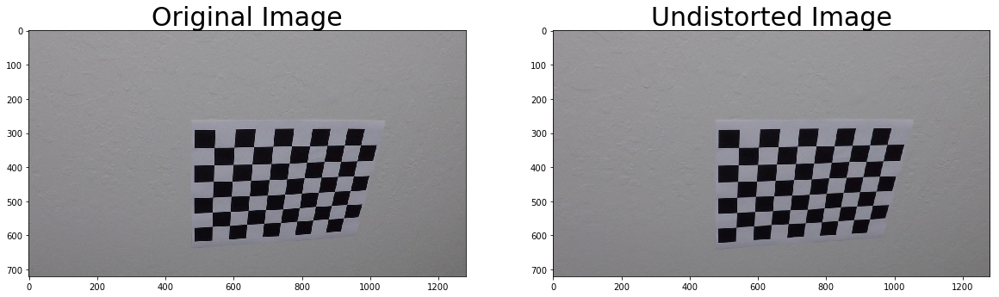

In [7]:
from random import randint

x = randint(1,20)
filname= 'camera_cal/calibration'+str(x)+'.jpg'
img = mpimg.imread(filname)
img_size = (img.shape[1], img.shape[0])


# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    if img.ndim ==2:
        gray = img
    else: 
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)

    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    grad_binary = sbinary
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    if img.ndim ==2:
        gray = img
    else: 
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    gradmag = np.sqrt(sobelx**2+sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
  
    #print(img.shape, len(img),img.ndim)
    if img.ndim ==2:
        gray = img
    else: 
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_direction = np.arctan2(abs_sobely,abs_sobelx)
    dir_binary = np.zeros_like(grad_direction)
    dir_binary[(grad_direction > thresh[0] )& (grad_direction < thresh[1])] = 1

    return dir_binary

def clr_threshold(img, thresh=(0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    #thresh = (170, 255)
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    return S, binary
    

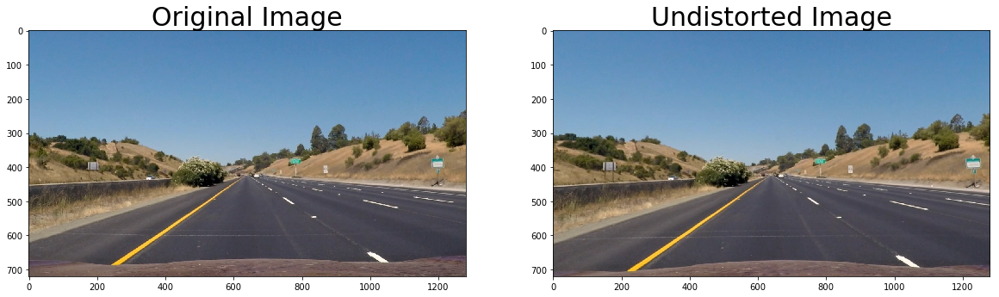

In [9]:
# 1- Removing distortion from image.
testimage = mpimg.imread('test_images/straight_lines1.jpg')
#testimage = mpimg.imread('test_images/straight_lines2.jpg')
#testimage = mpimg.imread('test_images/test1.jpg')
#testimage = mpimg.imread('test_images/test2.jpg')


testimage_u = cv2.undistort(testimage, mtx, dist, None, mtx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(testimage)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(testimage_u)
ax2.set_title('Undistorted Image', fontsize=30)

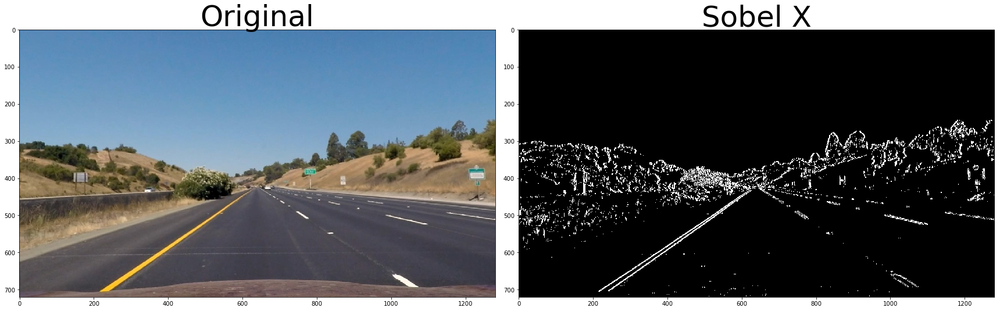

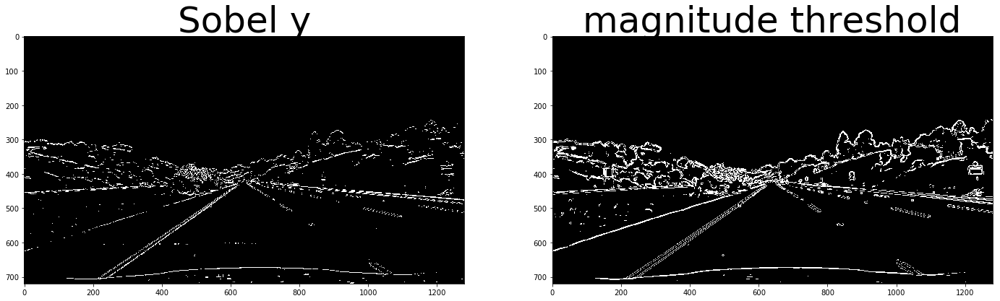

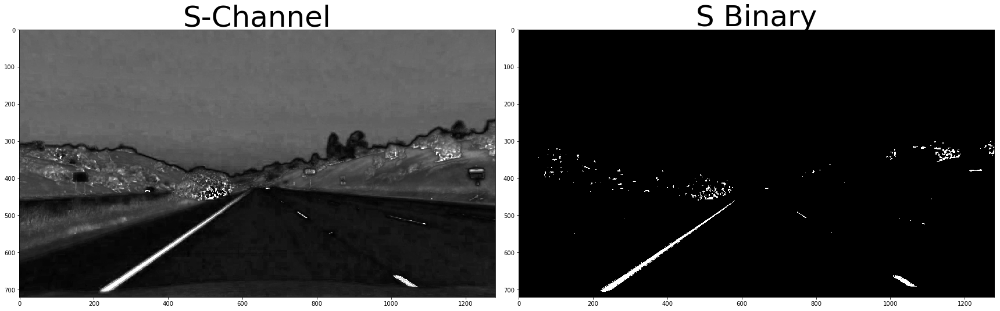

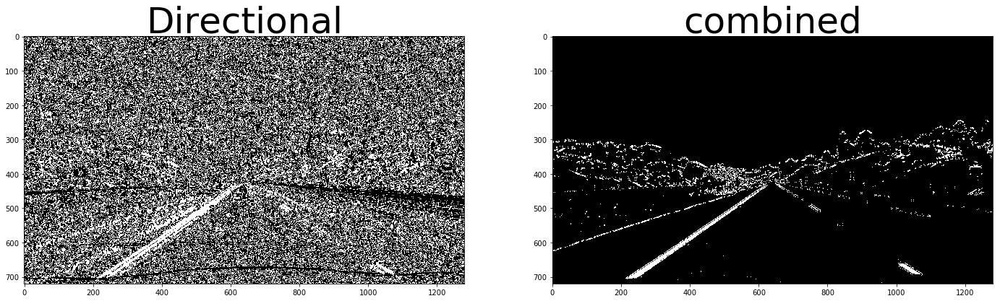

In [10]:

testimage = testimage_u



img_sobelx    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comp = np.zeros_like(img_sobelx)
img_comp[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(testimage, cmap='gray')
ax1.set_title('Original', fontsize=50)
ax2.imshow(img_sobelx, cmap='gray')
ax2.set_title('Sobel X', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

ff, (ax3, ax4) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(img_sobely, cmap='gray')
ax3.set_title('Sobel y', fontsize=50)
ax4.imshow(img_mag, cmap='gray')
ax4.set_title('magnitude threshold', fontsize=50)

#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax5, ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(S, cmap ='gray')
ax5.set_title('S-Channel', fontsize=50)
ax6.imshow(img_clr, cmap='gray')
ax6.set_title('S Binary', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


ff, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(img_dir, cmap='gray')
ax7.set_title('Directional', fontsize=50)
ax8.imshow(img_comp, cmap='gray')
ax8.set_title('combined',fontsize = 50)


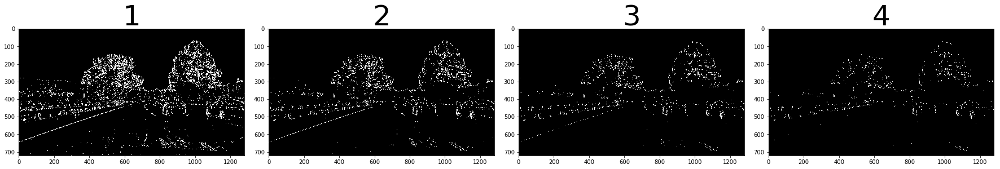

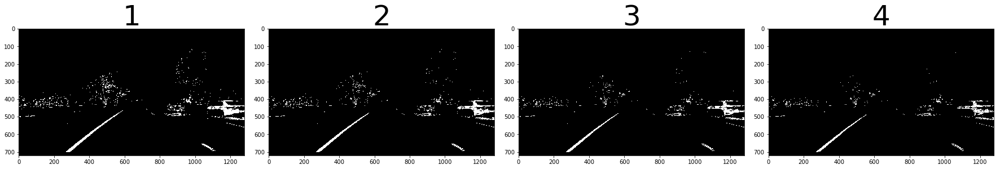

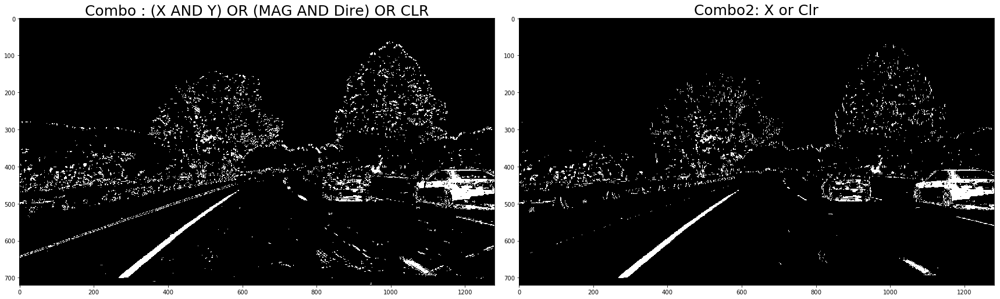

In [69]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test1.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test1     = testimage

img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


    
img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test1 = img_comb #selected threshold combo

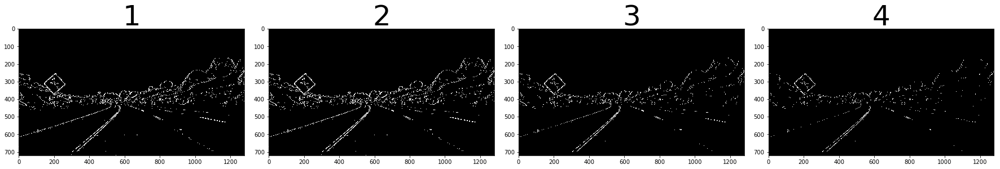

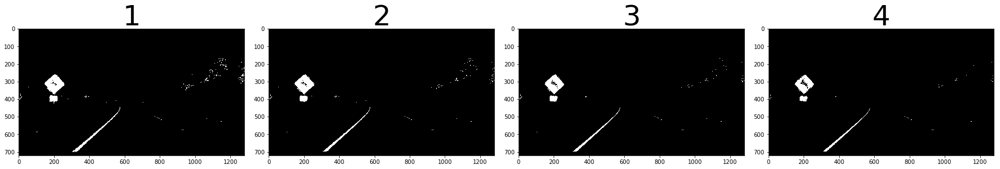

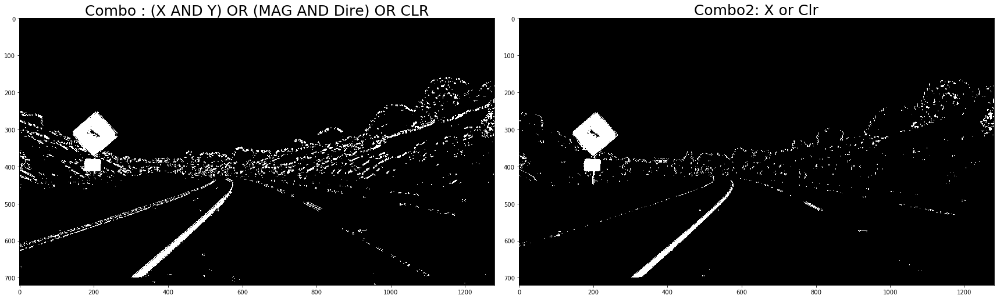

In [72]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test2.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test2     = testimage

img_sobel1    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test2 = img_comb #selected threshold combo

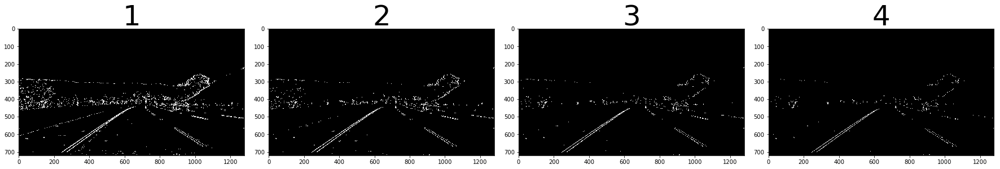

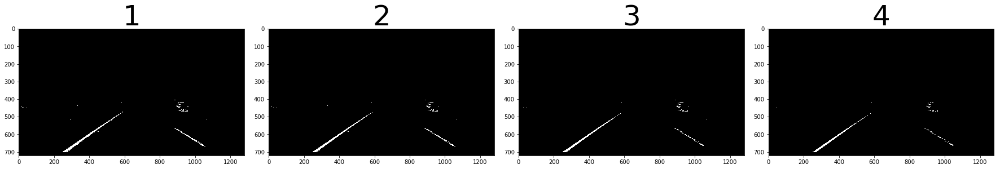

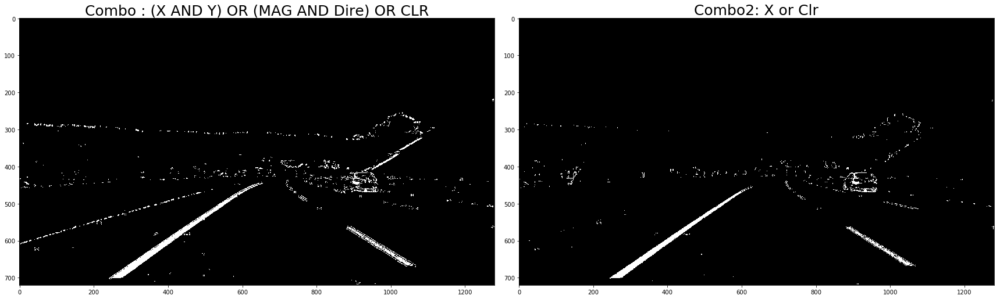

In [82]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test3.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test3     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                     = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test3 = img_comb #selected threshold combo

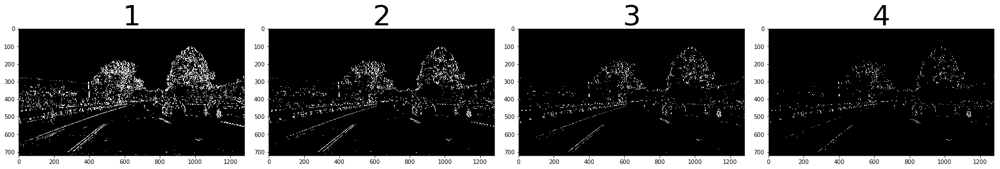

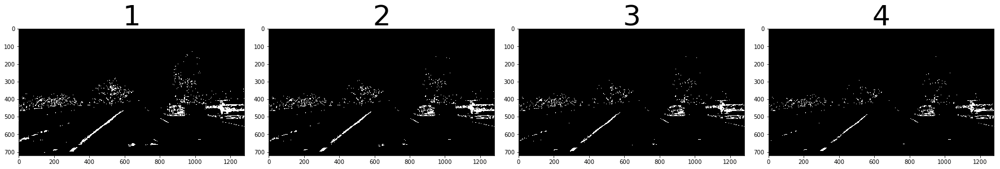

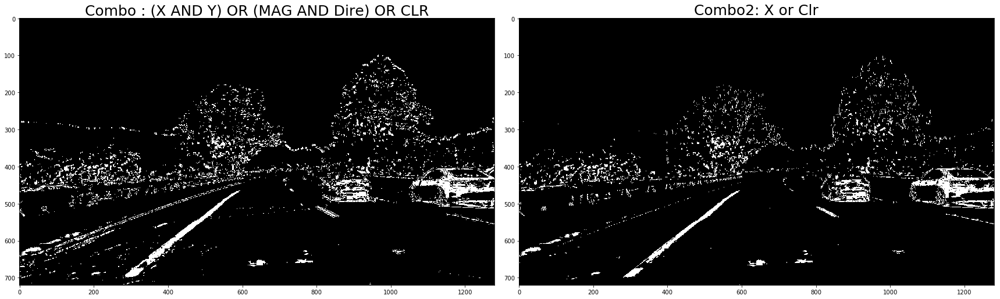

In [81]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test4.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test4     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test4 = img_comb #selected threshold combo

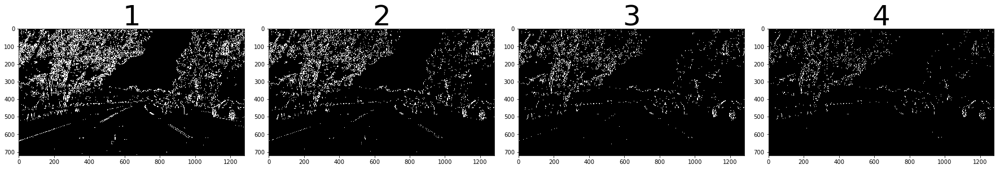

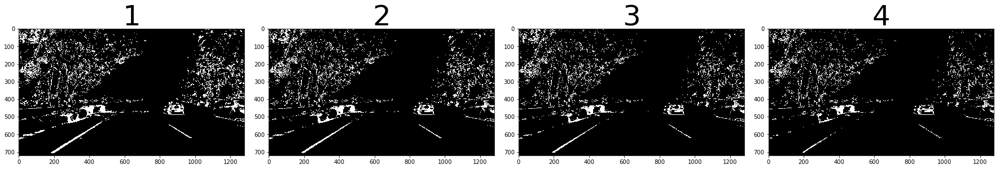

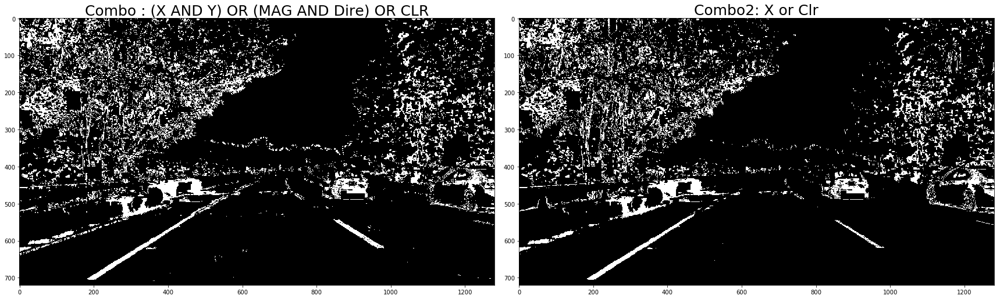

In [80]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test5.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test5     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                  = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test5 = img_comb #selected threshold combo

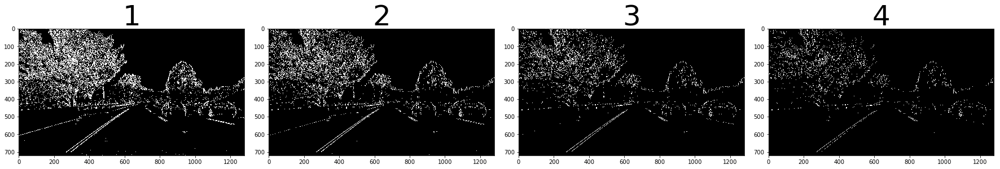

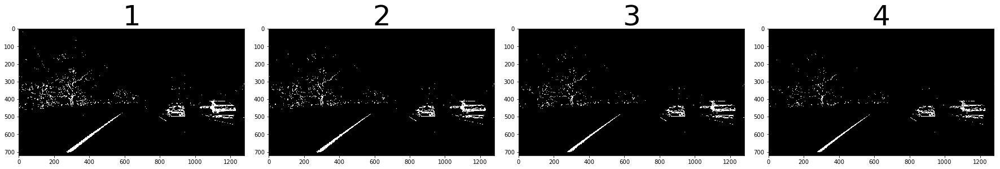

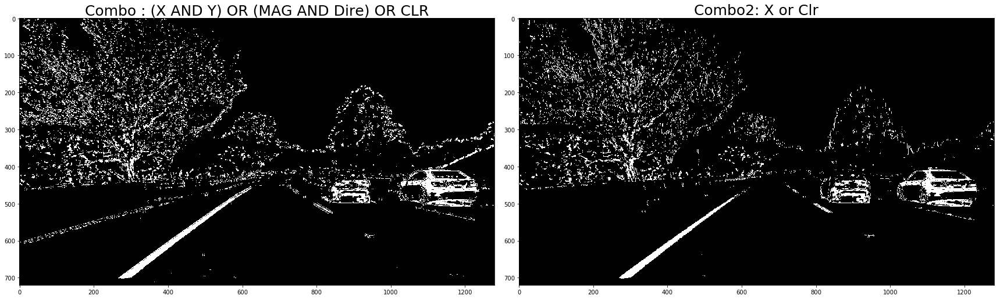

In [79]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test6.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test6     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test6 = img_comb #selected threshold combo

In [77]:
def warp(img):
    img_size = (img.shape[1],img.shape[0])
    src = np.float32(
    [[670,440],
    [1065,690],
    [240,690],
    [610,440]])
    dst = np.float32(  # kept playing with these numbers to get an optimum result, better lines
    [[800,0],
     [800,700],
     [400,700],
     [400,0]])
    M = cv2.getPerspectiveTransform(src,dst)
    warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
    
    return warped

def warp2(img):  #old values, I changed the main function to test other settings
    img_size = (img.shape[1],img.shape[0])
    src = np.float32(
    [[670,440],
    [1065,690],
    [240,690],
    [610,440]])
    dst = np.float32(  # kept playing with these numbers to get an optimum result, better lines
    [[800,0],
     [800,700],
     [400,700],
     [400,0]])
    M = cv2.getPerspectiveTransform(src,dst)
    warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
    
    return warped

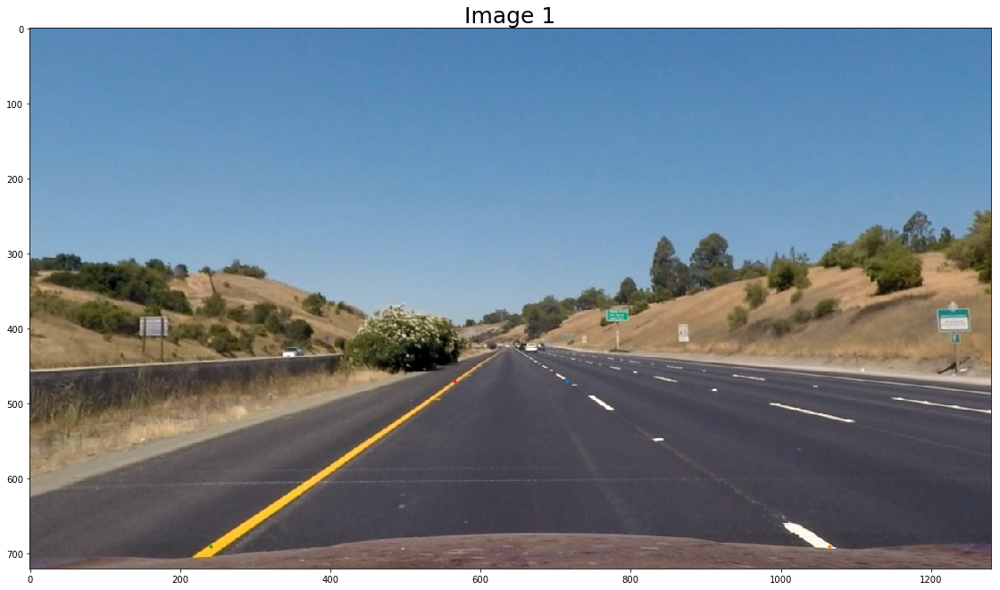

In [78]:
testimage  = mpimg.imread('test_images/straight_lines1.jpg')
testimage2 = mpimg.imread('test_images/straight_lines2.jpg')
testimage  = cv2.undistort(testimage, mtx, dist, None, mtx)
testimage2 = cv2.undistort(testimage2, mtx, dist, None, mtx)

f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
f.tight_layout()
ax1.imshow(testimage, cmap='gray')
ax1.set_title('Image 1', fontsize=25)
ax1.plot(715,470,'.')
ax1.plot(1065,690,'.')
ax1.plot(240,690,'.')
ax1.plot(565,470,'.')

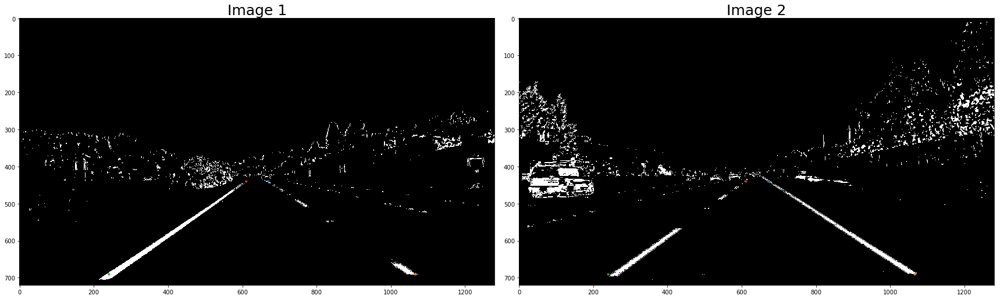

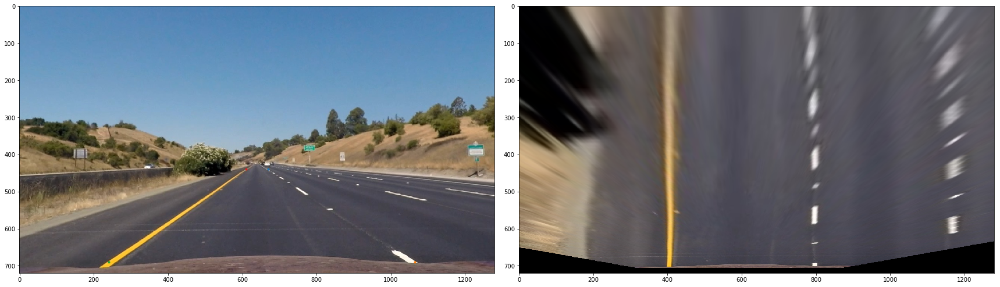

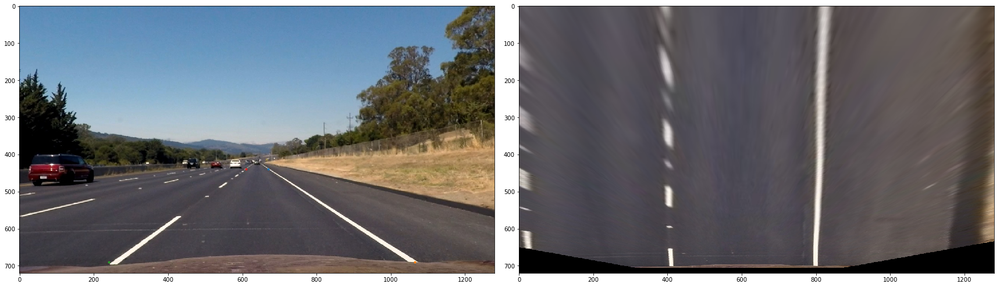

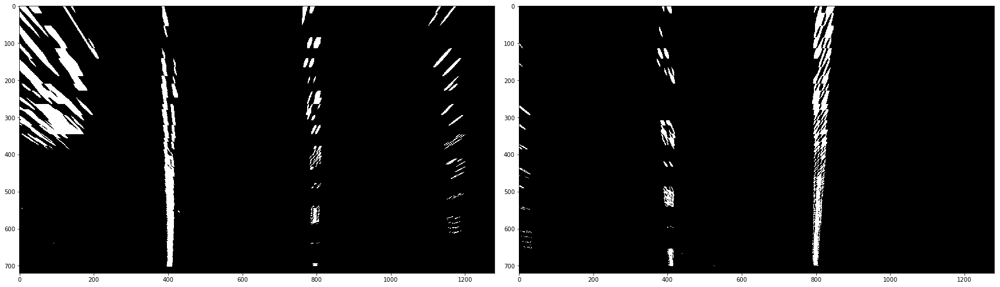

In [86]:
# Prespective Transform Test on Straight lines

testimage  = mpimg.imread('test_images/straight_lines1.jpg')
testimage2 = mpimg.imread('test_images/straight_lines2.jpg')
testimage  = cv2.undistort(testimage, mtx, dist, None, mtx)
testimage2 = cv2.undistort(testimage2, mtx, dist, None, mtx)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(50,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(50,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_sobelx2    = abs_sobel_thresh(testimage2,'x',9,(50,100))
img_sobely2   = abs_sobel_thresh(testimage2,'y',9,(50,100))
img_mag2       = mag_thresh(testimage2,9,(40,100))
img_dir2       = dir_threshold(testimage2,9,(0.7,1.3))
S, img_clr2    = clr_threshold(testimage2,(150,255))

img_1 = np.zeros_like(img_sobelx)
#img_1[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_1[((img_sobelx == 1)  | (img_clr == 1))] =1
img_2 = np.zeros_like(img_sobelx)
#img_2[((img_sobelx2 == 1) & (img_sobely2 == 1)) | ((img_mag2 == 1) & (img_dir2 == 1))|(img_clr2 ==1)] = 1
img_2[((img_sobelx2 == 1)  | (img_clr2 == 1))] =1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_1, cmap='gray')
ax1.set_title('Image 1', fontsize=25)
ax1.plot(670,440,'.')
ax1.plot(1065,690,'.')
ax1.plot(240,690,'.')
ax1.plot(610,440,'.')

ax2.imshow(img_2, cmap='gray')
ax2.set_title('Image 2', fontsize=25)

ax2.plot(670,440,'.')
ax2.plot(1065,690,'.')
ax2.plot(240,690,'.')
ax2.plot(610,440,'.')

w_img_1 = warp(img_1)
w_img_2 = warp(img_2)
w_testimage  = warp(testimage)
w_testimage2 = warp(testimage2)

f, (ax5,ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(testimage)
ax5.plot(670,440,'.')
ax5.plot(1065,690,'.')
ax5.plot(240,690,'.')
ax5.plot(610,440,'.')
ax6.imshow(w_testimage)

f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(testimage2)
ax7.plot(670,440,'.')
ax7.plot(1065,690,'.')
ax7.plot(240,690,'.')
ax7.plot(610,440,'.')
ax8.imshow(w_testimage2)

f, (ax3,ax4) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(w_img_1, cmap='gray')
ax4.imshow(w_img_2, cmap='gray')

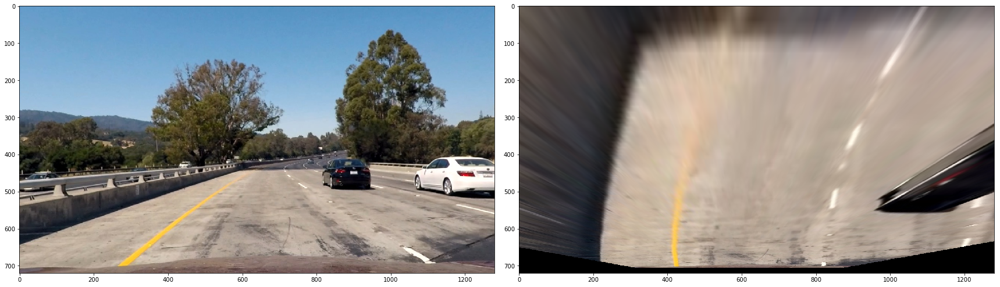

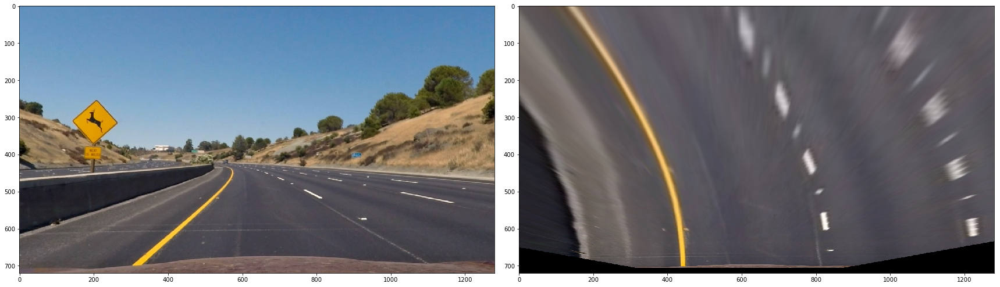

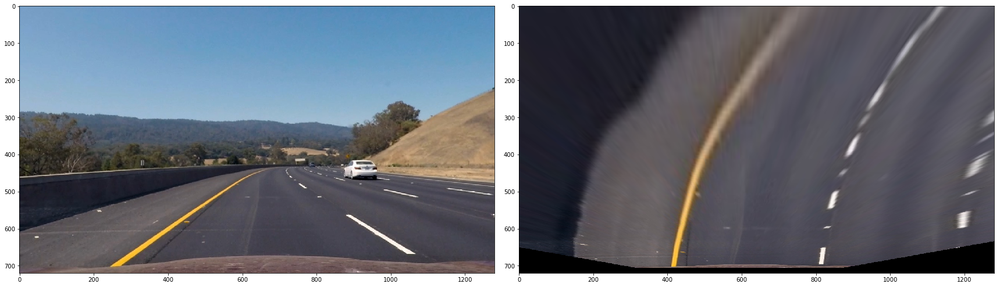

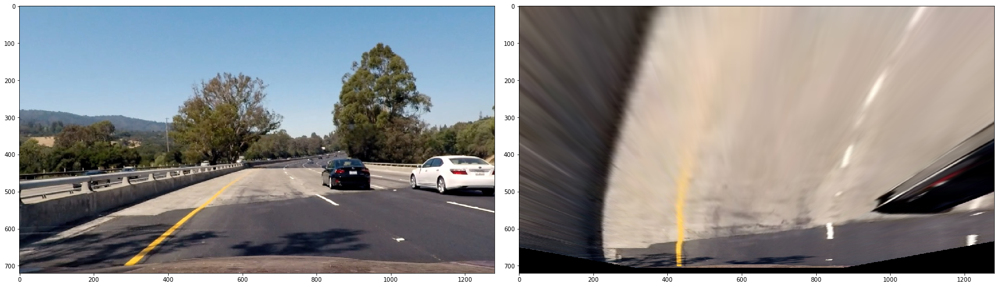

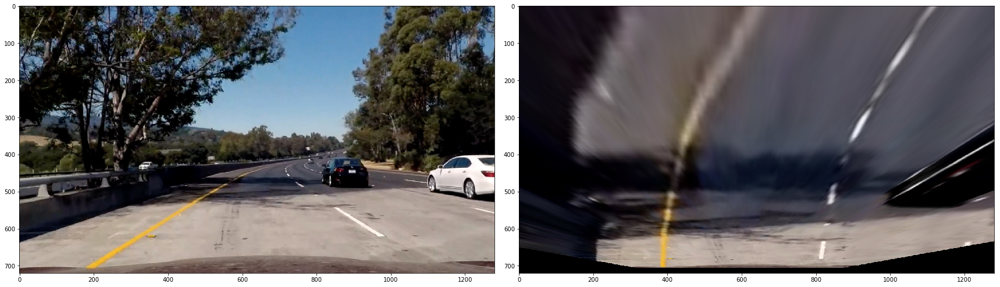

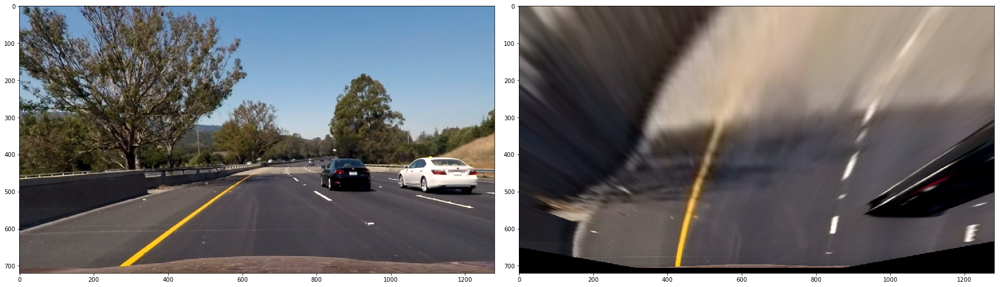

In [87]:
## warping curved lanes

w_test1 = warp(test1)
w_test2 = warp(test2)
w_test3 = warp(test3)
w_test4 = warp(test4)
w_test5 = warp(test5)
w_test6 = warp(test6)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test1, cmap='gray')
ax2.imshow(w_test1, cmap='gray')
f, (ax3,ax4)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(test2, cmap='gray')
ax4.imshow(w_test2, cmap='gray')
f, (ax5,ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(test3, cmap='gray')
ax6.imshow(w_test3, cmap='gray')
f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(test4, cmap='gray')
ax8.imshow(w_test4, cmap='gray')
f, (ax9,ax10)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax9.imshow(test5, cmap='gray')
ax10.imshow(w_test5, cmap='gray')
f, (ax11,ax12) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax11.imshow(test6, cmap='gray')
ax12.imshow(w_test6, cmap='gray')


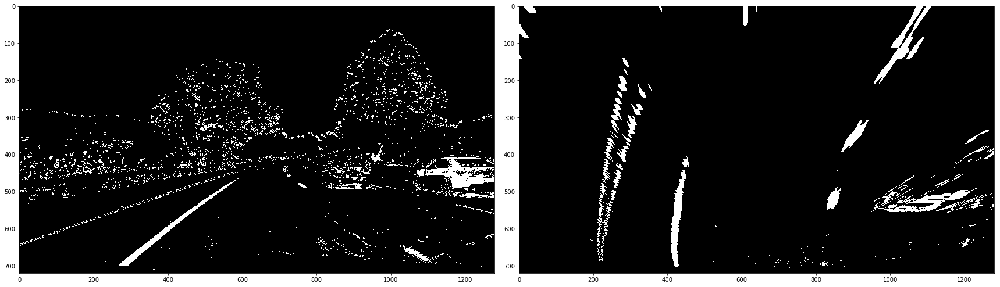

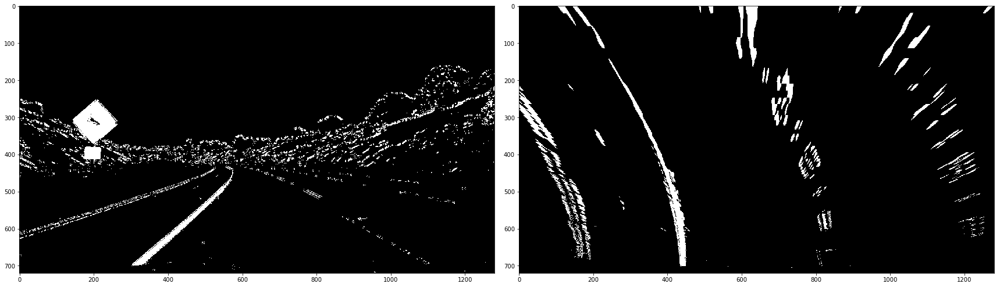

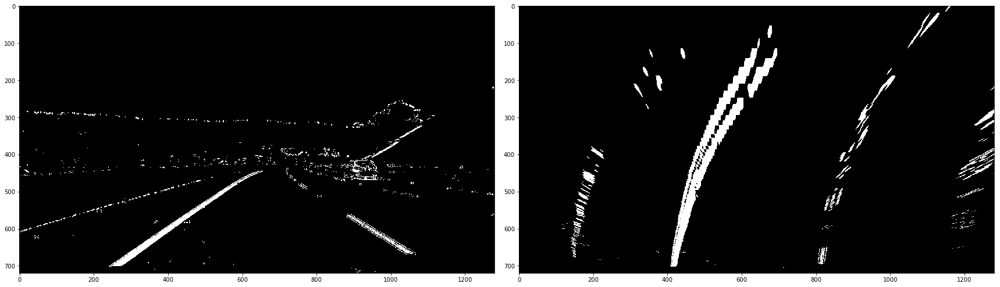

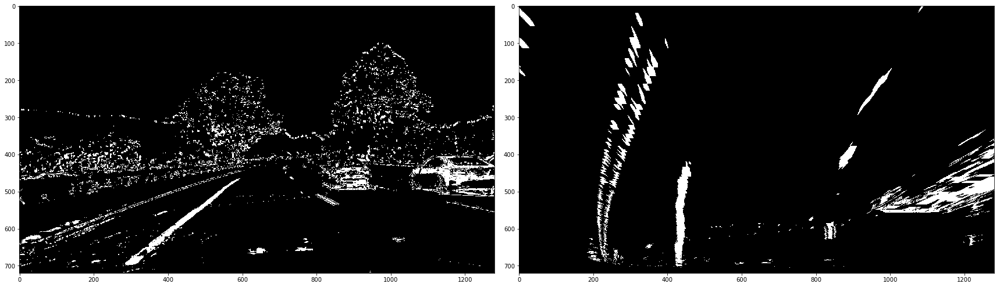

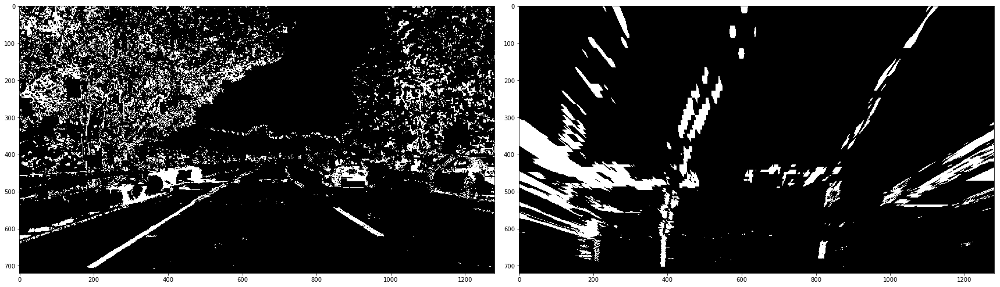

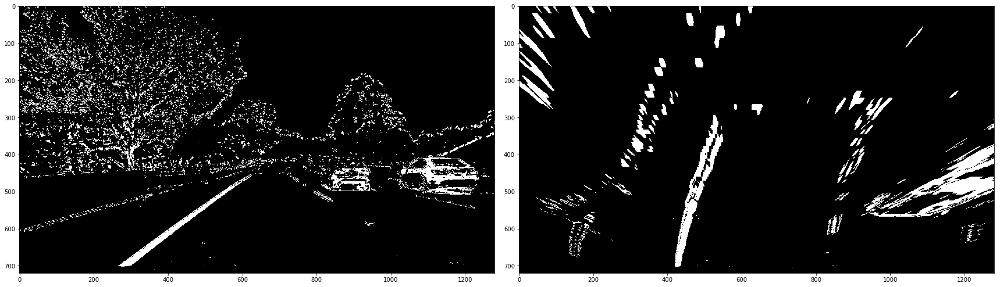

In [88]:
## warping curved lanes

w_test1 = warp(img_test1)
w_test2 = warp(img_test2)
w_test3 = warp(img_test3)
w_test4 = warp(img_test4)
w_test5 = warp(img_test5)
w_test6 = warp(img_test6)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_test1, cmap='gray')
ax2.imshow(w_test1, cmap='gray')
f, (ax3,ax4)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(img_test2, cmap='gray')
ax4.imshow(w_test2, cmap='gray')
f, (ax5,ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(img_test3, cmap='gray')
ax6.imshow(w_test3, cmap='gray')
f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(img_test4, cmap='gray')
ax8.imshow(w_test4, cmap='gray')
f, (ax9,ax10)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax9.imshow(img_test5, cmap='gray')
ax10.imshow(w_test5, cmap='gray')
f, (ax11,ax12) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax11.imshow(img_test6, cmap='gray')
ax12.imshow(w_test6, cmap='gray')


(720, 1280, 3)
nonzero (array([  0,   0,   0, ..., 702, 704, 705]), array([ 44,  45,  46, ..., 567, 470, 735])) length 2
nonzerox [ 44  45  46 ..., 567 470 735] 57250
nonzeroy [  0   0   0 ..., 702 704 705] 57250
0
1
2
3
4
5
6
7
8
left [array([55746, 55747, 55748, ..., 57245, 57246, 57248]), array([50615, 50616, 50617, ..., 55733, 55734, 55735]), array([37052, 37053, 37054, ..., 50525, 50526, 50527]), array([25848, 25849, 25850, ..., 36861, 36862, 36863]), array([19296, 19297, 19298, ..., 25763, 25764, 25765]), array([12955, 12956, 12957, 12958, 13052, 13053, 13054, 13055, 13147,
       13148, 13149, 13241, 13242, 13243, 13330, 13331, 13419, 13420,
       13505, 15288, 15289, 15290, 15291, 15404, 15405, 15406, 15407,
       15408, 15409, 15523, 15524, 15525, 15526, 15527, 15528, 15643,
       15644, 15645, 15646, 15647, 15648, 15649, 15763, 15764, 15765,
       15766, 15767, 15768, 15769, 15770, 15886, 15887, 15888, 15889,
       15890, 15891, 15892, 15893, 16013, 16014, 16015, 16016, 

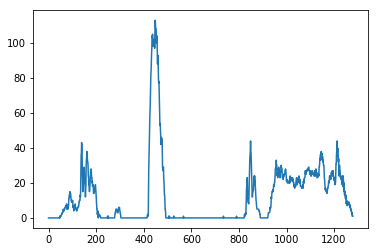

In [89]:
import numpy as np

#binary_warped = w_img_1
binary_warped = w_test6

# This is a parameter that could be adjusted to account for the noise in the warped image, and to easily identify the start of the lane
#histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
histogram = np.sum(binary_warped[500:,:], axis=0)

plt.plot(histogram)

out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
print(out_img.shape)

midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

nwindows = 9

window_height = np.int(binary_warped.shape[0]/nwindows)

nonzero = binary_warped.nonzero()
print('nonzero',nonzero, 'length',len(nonzero))

nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
print('nonzerox',nonzerox, len(nonzerox))
print('nonzeroy',nonzeroy, len(nonzeroy))

leftx_current = leftx_base
rightx_current = rightx_base

margin = 100

#could be adjusted to configure sensitivity of detecting the new center of the line
minpix = 50

left_lane_inds = []
right_lane_inds = []


for window in range(nwindows):
    
    win_y_low       = binary_warped.shape[0] - (window+1)*window_height
    win_y_high      = binary_warped.shape[0] - (window)*window_height
    
    win_xleft_low   = leftx_current - margin
    win_xleft_high  = leftx_current + margin
    
    win_xright_low  = rightx_current - margin
    win_xright_high = rightx_current + margin
    
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
    
    good_left_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

    print(len(left_lane_inds))
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
# Concatenate the arrays of indices
print('left',left_lane_inds)
left_lane_inds  = np.concatenate((left_lane_inds))
right_lane_inds = np.concatenate((right_lane_inds))

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


(720, 0)

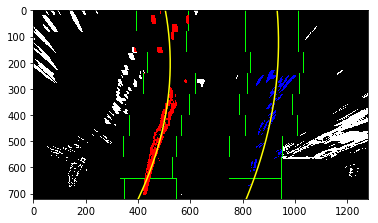

In [90]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# Realized that to cancel noise from unwanted objects/lines, we can filter out parts of image, and shorten the horizon for warping
